In [24]:
from datetime import datetime
import pandas as pd
import numpy as np
from fbprophet import Prophet
import plotly.express as px

In [2]:
flow_data_file_list = [f'flow_{i}.xlsx' for i in range(1, 5)]
rain_data_list = ['rain_1.xlsx', 'rain_2.xlsx']

In [3]:
flow_df_list = [pd.read_excel(flow_data_file) for flow_data_file in flow_data_file_list]
rain_df_list = [pd.read_excel(rain_data_file) for rain_data_file in rain_data_list]

In [4]:
flow_data = pd.concat(flow_df_list)
rain_data = pd.concat(rain_df_list)

Handling missing data etc and other transformations.

In [11]:
def data_transform(df: pd.DataFrame):
    """
    Apply transformations on a dataframe. In this
    :param df: pandas dataframe; flow and rain data in this project.
    :return: dataframe after transformations.
    """
    # handles missing values
    df = df[df['time'] == df['time']]
    # convert timestamps to date time objects
    df['time'] = df['time'].apply(lambda x: datetime.fromtimestamp(x))
    df = df.sort_values(by=['time'])
    return df

In [12]:
flow_transformed = data_transform(flow_data)
rain_transformed = data_transform(rain_data)

/var/folders/gr/pz0pcfps66j0_bv8bz_hryb40000gn/T/ipykernel_34828/3955235570.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time'] = df['time'].apply(lambda x: datetime.fromtimestamp(x))


In [13]:
flow_transformed.head()

,time,value
0,2018-03-02 01:06:40,152.210075
1,2018-03-02 01:06:40,210.000000
2,2018-03-02 12:46:40,127.991291
3,2018-03-02 12:46:40,423.000000
4,2018-03-02 12:46:40,120.517200


In [19]:
flow_transformed['value'].max()

1231.0

In [14]:
rain_transformed.head()

,time,rain
0,2018-03-02 13:36:40,-0.5
1,2018-03-02 17:46:40,-0.5
2,2018-03-03 01:33:20,-0.5
3,2018-03-03 01:33:20,-0.5
4,2018-03-03 01:33:20,-0.5


In [42]:
def draw_pictures(df_: pd.DataFrame):
    """Draw a line chart with plotly.express."""
    fig_ = px.line(df_.reset_index(), x='time', y=df_.columns[-1], title='Chart')
    fig_.show()

In [17]:
draw_pictures(flow_transformed)

In [43]:
draw_pictures(rain_transformed[rain_transformed['time'] <= '2018-07-15'])

In [35]:
def model_training(df: pd.DataFrame):
    """Detect anomaly with fbprophet.

    The function will do the following things:
    1. split training and testing sets.
    2. Train a model with 95% confidence interval.
    3. Make predictions and forecasts.
    """
    df = df.reset_index()[['time', 'value']].rename({'time':'ds', 'value':'y'}, axis='columns')
    train = df[(df['ds'] >= '2018-03-01') & (df['ds'] <= '2018-09-01')]
    test = df[(df['ds'] > '2018-09-01')]
    model_ = Prophet(changepoint_range=0.95)
    model_.fit(train)
    future = model_.make_future_dataframe(periods=100)
    forecast = model_.predict(future)
    fig1 = model_.plot(forecast)
    return fig1, forecast, df

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/Users/grandmoon/.virtualenvs/pay-attention-mm/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Initial log joint probability = -61.2493
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        152441    0.00127431       13538.7           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        154405     0.0267382       23913.4           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        156835     0.0414047       33315.6           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        157624    0.00394959       7954.36           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        158887    0.00436662       33186.1      0.4076      0.4076      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/grandmoon/.virtualenvs/pay-attention-mm/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/grandmoon/.virtualenvs/pay-attention-mm/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



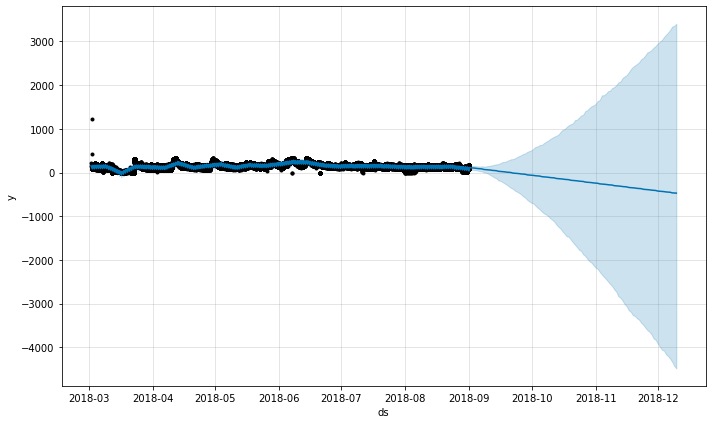

In [36]:
figure, foress, df = model_training(flow_transformed)

In [37]:
foress.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-03-02 01:06:40,132.175441,112.547859,198.367085,132.175441,132.175441,23.261923,23.261923,23.261923,19.994672,19.994672,19.994672,3.267251,3.267251,3.267251,0.0,0.0,0.0,155.437365
1,2018-03-02 12:46:40,132.646467,74.746837,160.492270,132.646467,132.646467,-15.974139,-15.974139,-15.974139,-15.513432,-15.513432,-15.513432,-0.460707,-0.460707,-0.460707,0.0,0.0,0.0,116.672329
2,2018-03-02 13:03:20,132.657682,70.561957,153.795306,132.657682,132.657682,-18.679388,-18.679388,-18.679388,-18.113225,-18.113225,-18.113225,-0.566163,-0.566163,-0.566163,0.0,0.0,0.0,113.978294
3,2018-03-02 13:20:00,132.668897,65.658076,156.678467,132.668897,132.668897,-21.233099,-21.233099,-21.233099,-20.561526,-20.561526,-20.561526,-0.671573,-0.671573,-0.671573,0.0,0.0,0.0,111.435798
4,2018-03-02 13:36:40,132.680112,67.649101,151.920797,132.680112,132.680112,-23.663963,-23.663963,-23.663963,-22.887085,-22.887085,-22.887085,-0.776878,-0.776878,-0.776878,0.0,0.0,0.0,109.016149


In [39]:
result = pd.concat([df, foress[['yhat','yhat_lower','yhat_upper']]], axis=1)

In [40]:
# Handle the uncertainty and anomaly
result['error'] = result['y'] - result['yhat']
result['uncertainty'] = result['yhat_upper'] - result['yhat_lower']
result['anomaly'] = result.apply(lambda x: True if(np.abs(x['error']) > 1.5*x['uncertainty']) else False, axis = 1)
fig = px.scatter(result, x='ds', y='y', color='anomaly', title='Anamaly data chart')

In [41]:
fig.show()

Compare the charts, we can see the relationship between the flow data and rain data, especially during March and May 2018. When there was higher than usual amount of rain, the flow meter showed anomaly.

Other observations:

1. The two extreme outliers on 2 March 2018 might be data errors, since they deviated so much from the normal range of flow data.
2. Prolonged period of no rainfall would cause anomaly in the flow data as well, making it lower than its normal range.